## FMA visualization via dimensionality reduction techniques

In [1]:
%matplotlib inline

import pandas as pd
import numpy as np
import IPython.display as ipd

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import (PCA, KernelPCA)
from sklearn.manifold import (TSNE, Isomap)

import matplotlib.pyplot as plt
import seaborn as sns

import utils

#### Load features and tracks

In [2]:
(features, tracks) = utils.load_features()
features.shape, tracks.shape

((106574, 518), (106574, 52))

In [3]:
features.columns.get_level_values(0).unique()

Index(['chroma_cens', 'chroma_cqt', 'chroma_stft', 'mfcc', 'rmse',
       'spectral_bandwidth', 'spectral_centroid', 'spectral_contrast',
       'spectral_rolloff', 'tonnetz', 'zcr'],
      dtype='object', name='feature')

#### Run PCA using each feature group on the small subset (balanced top-level genres)

Unscaled - we see some features are dominated by outlier values; scaling is probably required

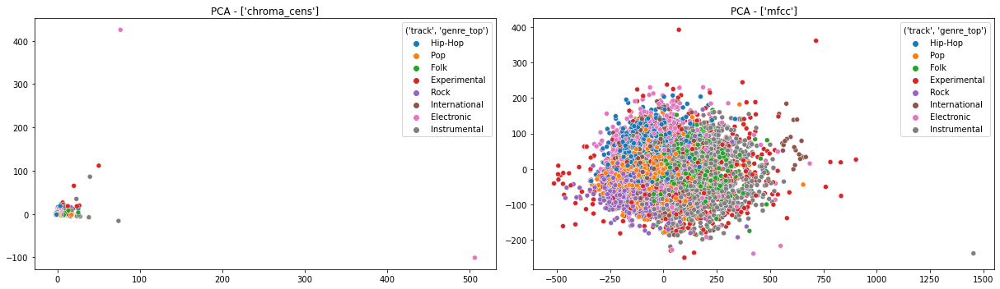

In [4]:
small = tracks['set', 'subset'] == 'small'
medium = tracks['set', 'subset'] == 'medium'

Y = tracks[small][('track','genre_top')]
df = features[small]

feature_sets = [['chroma_cens'],['mfcc']] 
utils.estimate_features(df, Y, feature_sets, 'PCA', PCA(n_components=2), scale=False)


#### Repeat with scaling - we see more structure

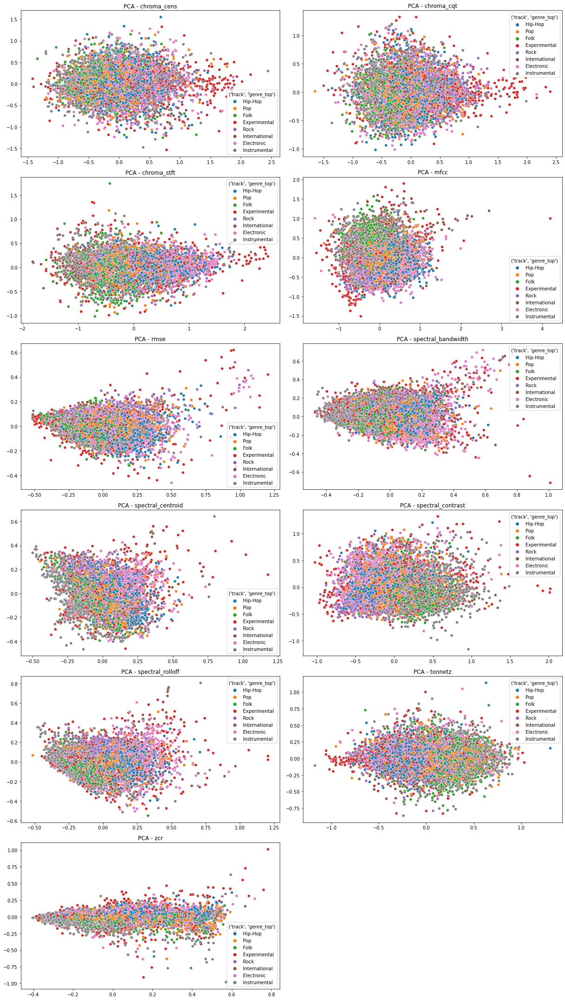

In [5]:
small = tracks['set', 'subset'] == 'small'
medium = tracks['set', 'subset'] == 'medium'

Y = tracks[small][('track','genre_top')]
df = features[small]

feature_sets = features.columns.get_level_values(0).unique()
utils.estimate_features(df, Y, feature_sets, 'PCA', PCA(n_components=2))


#### best and worst examples

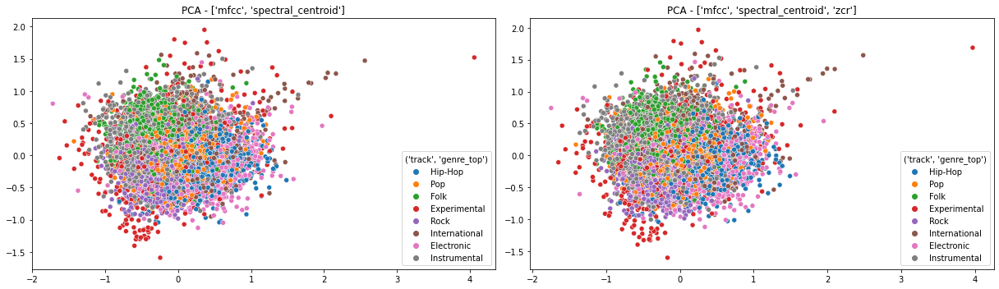

In [6]:
df = features[small]

feature_sets = [['mfcc', 'spectral_centroid'], ['mfcc','spectral_centroid','zcr']]
utils.estimate_features(df, Y, feature_sets, 'PCA', PCA(n_components=2))

#### PCA with some feature combos

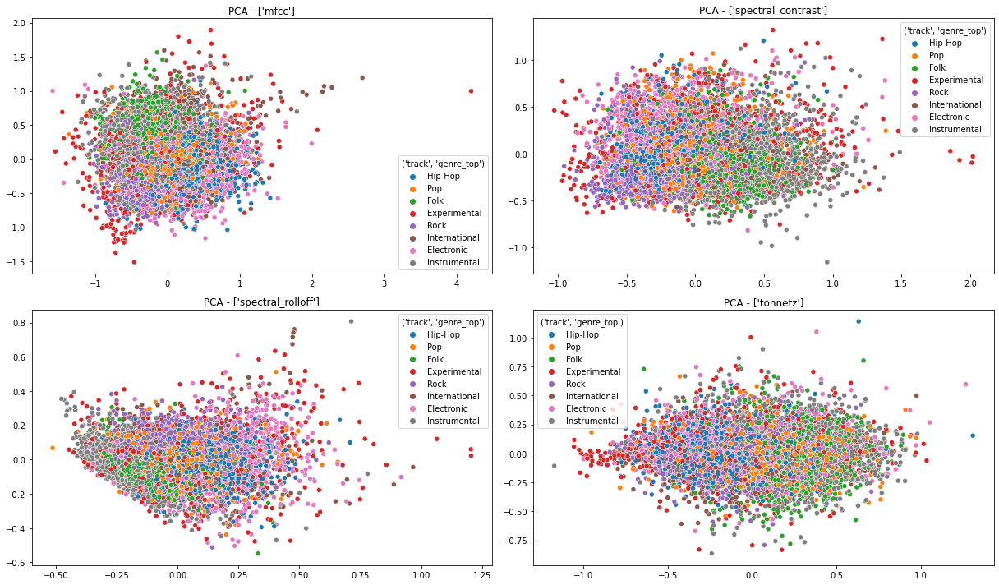

In [33]:
feature_sets = [['mfcc'], ['spectral_contrast'], ['spectral_rolloff'], ['tonnetz']]
utils.estimate_features(df, Y, feature_sets, 'PCA', PCA(n_components=2))

#### PCA all features

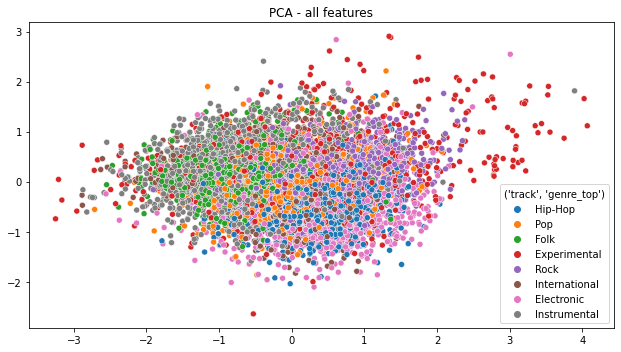

In [8]:
utils.estimate_all_features(df, Y, 'PCA', PCA(n_components=2))

There does appear to be some discrimination with PCA, and some features discriminate a bit better

### Non Linear techniques - default settings

Kernel PCA

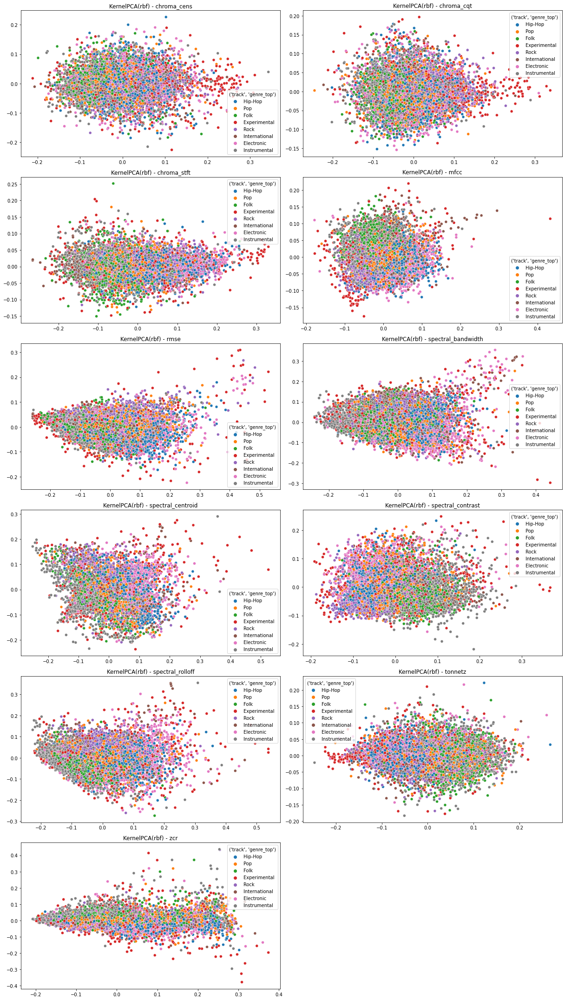

In [9]:
feature_sets = features.columns.get_level_values(0).unique()

utils.estimate_features(df, Y, feature_sets,
                        'KernelPCA(rbf)',
                        KernelPCA(n_components=2, kernel='rbf')) 


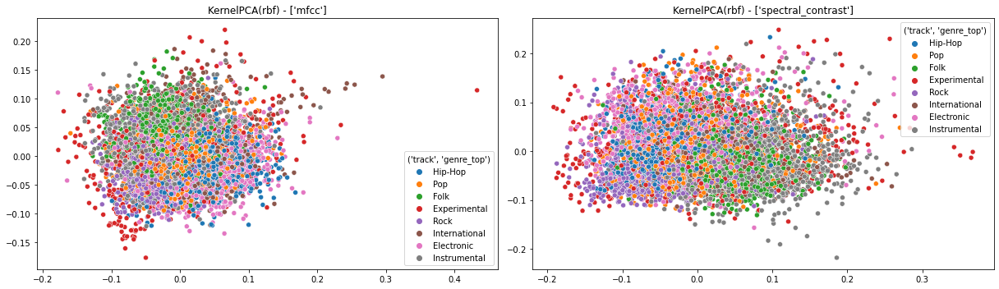

In [35]:
feature_sets=[['mfcc'],['spectral_contrast']]

utils.estimate_features(df, Y, feature_sets,
                        'KernelPCA(rbf)',
                        KernelPCA(n_components=2, kernel='rbf'))

### Isomap

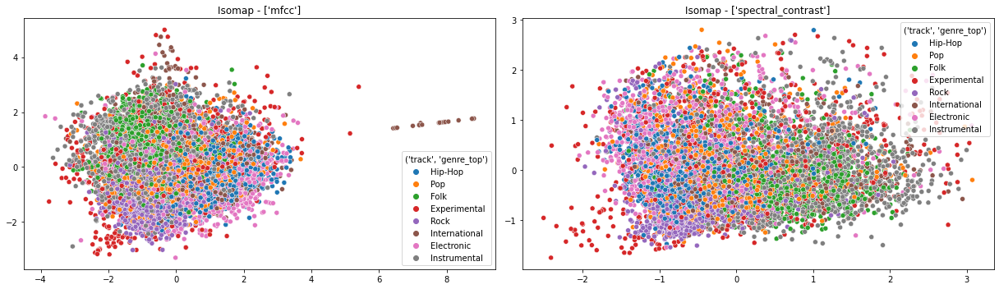

In [10]:

utils.estimate_features(df, Y, feature_sets, 
                    'Isomap',
                    Isomap(n_components=2,n_jobs=-1),
                    scale=True)


### TSNE

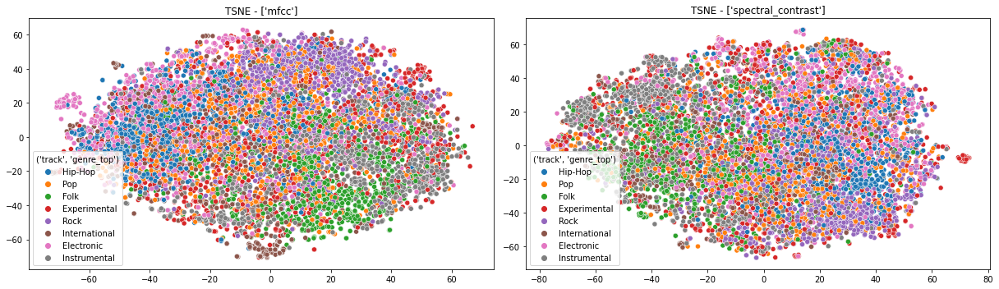

In [11]:
utils.estimate_features(df, Y, feature_sets, 'TSNE',
                        TSNE(n_components=2,  n_jobs=-1),
                        scale=True)


#### KPCA-RBF with parameters - attempt to improve 

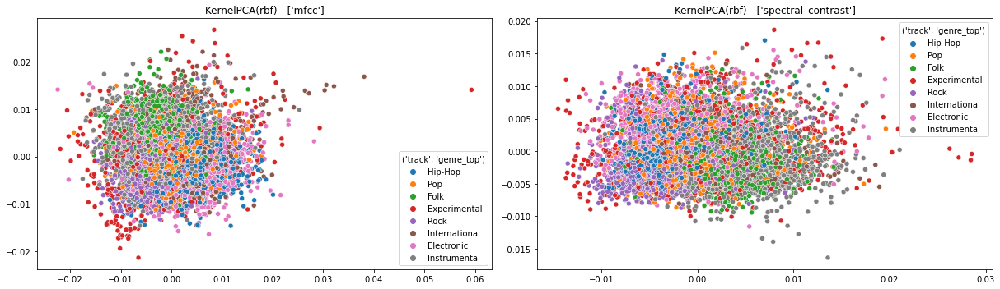

In [12]:
utils.estimate_features(df, Y, feature_sets,
                        'KernelPCA(rbf)',
                        KernelPCA(n_components=2, kernel='rbf', gamma=0.0001)) 


#### Isomap with parameters

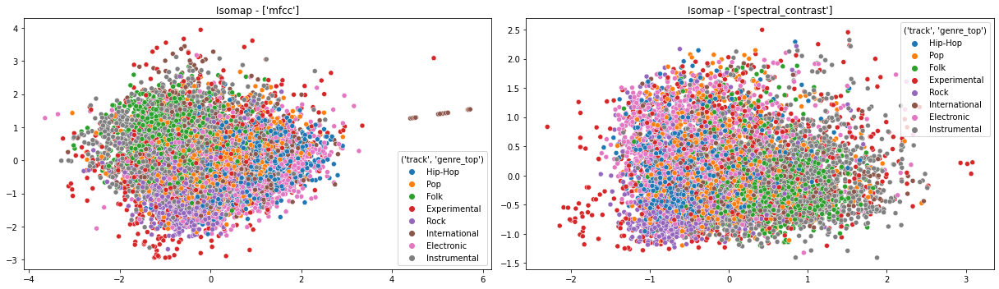

In [13]:
utils.estimate_features(df, Y, feature_sets, 
                    'Isomap',
                    Isomap(n_components=2,n_jobs=-1,n_neighbors=10),
                    scale=True)


### TSNE with parameters

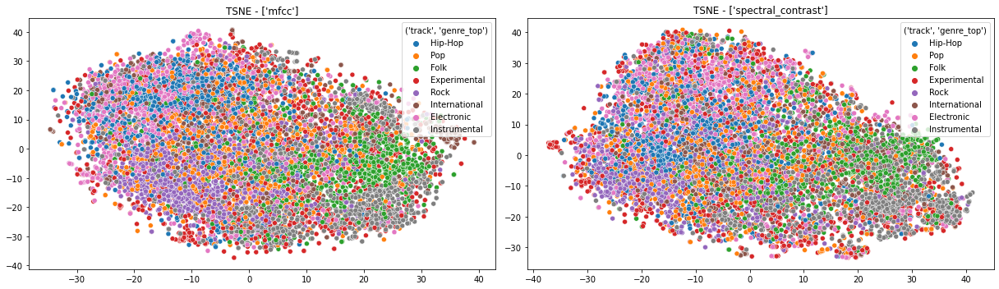

In [14]:
utils.estimate_features(df, Y, feature_sets, 'TSNE',
                        TSNE(n_components=2,perplexity=100, n_iter=2000,n_jobs=-1),
                        scale=True)


#### Feature combinations

Isomap may do a marginally better job; try it with a compbination of the more discriminatory features

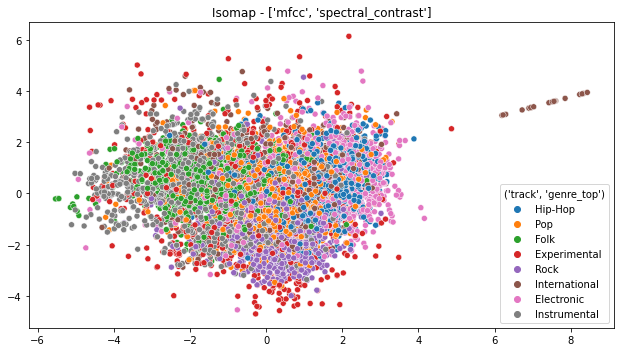

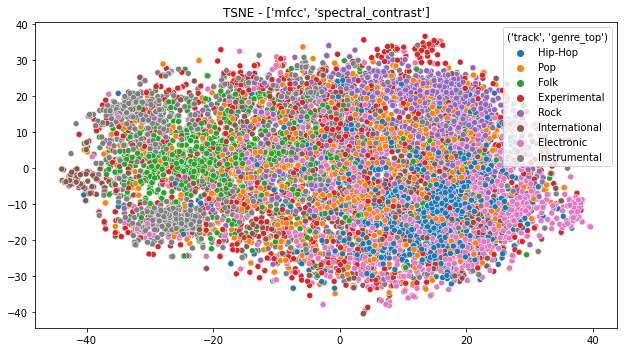

In [15]:
feature_sets =  [['mfcc','spectral_contrast']]
utils.estimate_features(df, Y, feature_sets, 'Isomap',
                        Isomap(n_components=2, n_jobs=-1))

utils.estimate_features(df, Y, feature_sets, 'TSNE',
                        TSNE(n_components=2, perplexity=100, n_iter=2000, n_jobs=-1))

#### All features with Isomap and TSNE

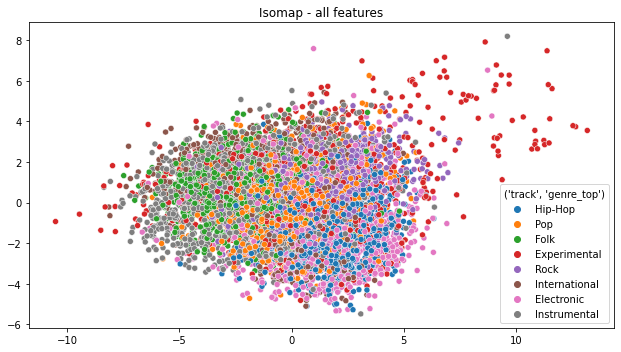

In [34]:
utils.estimate_all_features(df, Y, 'Isomap', Isomap(n_components=2, n_jobs=-1))

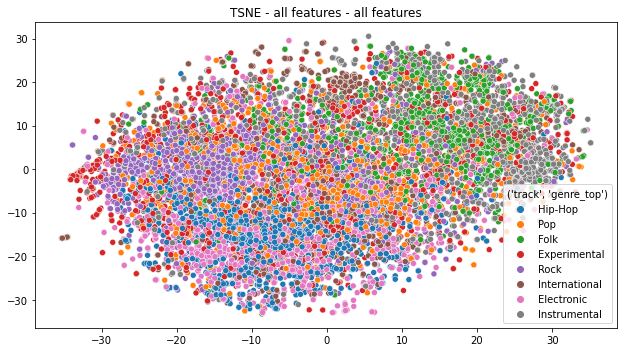

In [17]:
utils.estimate_all_features(df, Y, 'TSNE - all features',
                        TSNE(n_components=2,perplexity=100, n_iter=2000,n_jobs=-1))


#### All features minus Experimental with Isomap

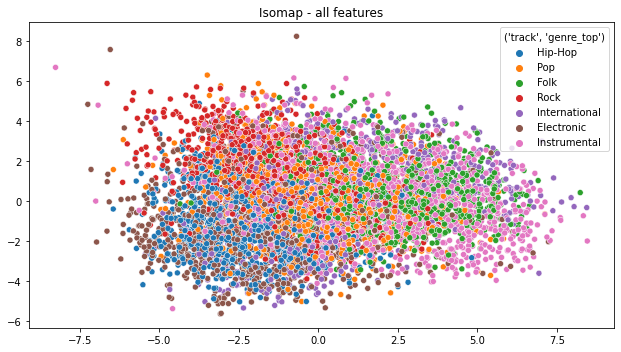

In [18]:
genres6 = ['Hip-Hop','Pop','Rock','Folk','Instrumental','International','Electronic'] 
subset = Y.isin(genres6)
Y6 = Y[subset]
df6 = df[subset]

utils.estimate_all_features(df6, Y6, 'Isomap',
                        Isomap(n_components=2, n_jobs=-1))

#### Individual statistics

Try isomap with just individual mfcc measures

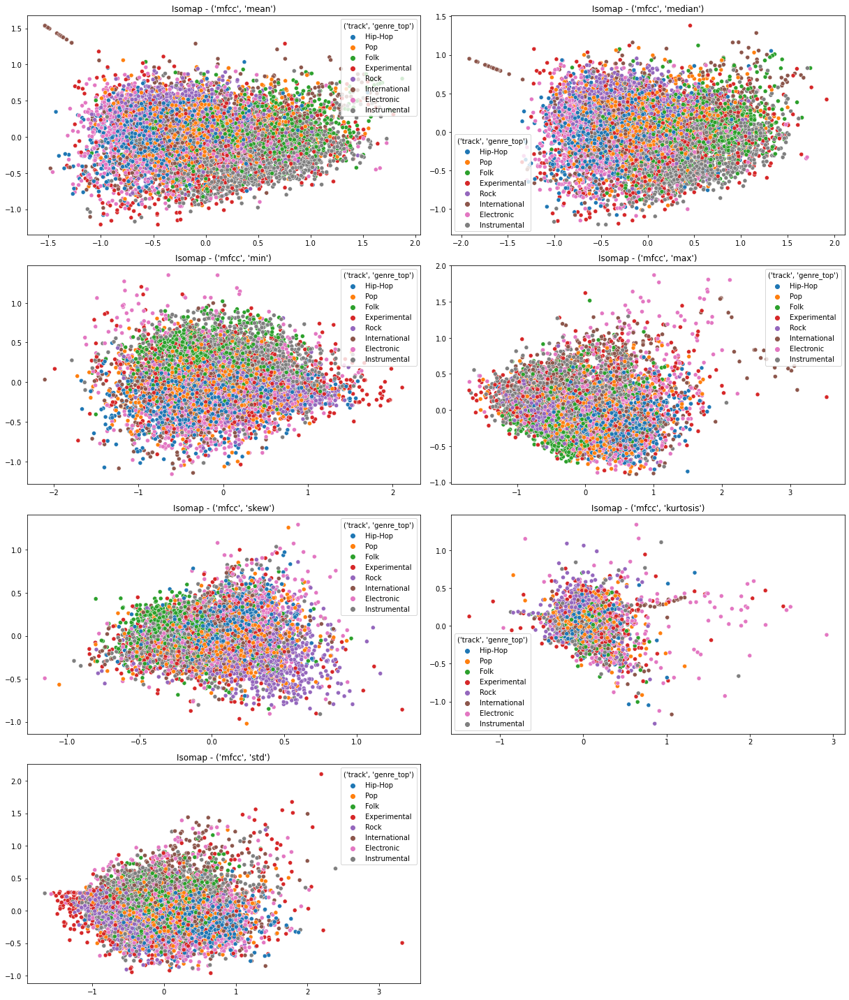

In [19]:
feature_sets =  [('mfcc', 'mean'),
                 ('mfcc', 'median'),
                 ('mfcc', 'min'),
                 ('mfcc', 'max'),
                 ('mfcc', 'skew'),
                 ('mfcc', 'kurtosis'),
                 ('mfcc', 'std')
                ]
utils.estimate_features(df, Y, feature_sets, 'Isomap',  Isomap(n_components=2, n_jobs=-1))

Again, some features seem to discriminate to a degree, and some techniques appear to discriminate a bit better
than others.

However, we also don't seem to achieve good separation. Some genres do seem 'farther apart', and some seem 'closer together' 

#### Compare dimensionality reduction on 2 sets of genres

* 1st set 'farther apart'
* 2nd set 'closer together'


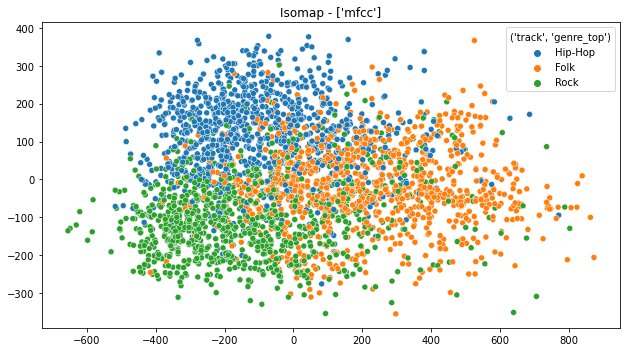

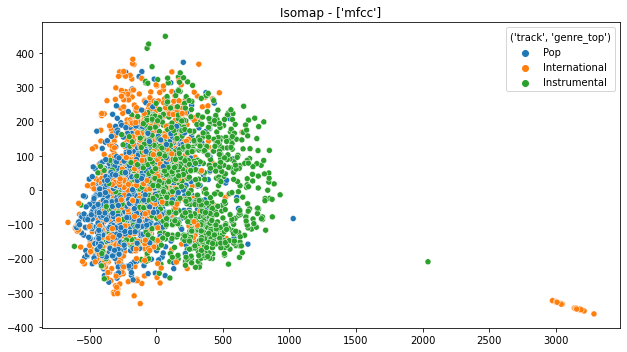

In [20]:
genre_pairs = [['Folk','Hip-Hop','Rock'],
               ['Instrumental','Pop','International']]

feature_sets =  [['mfcc']]

for genre_pair in genre_pairs:
    subset = Y.isin(genre_pair)
    Y1 = Y[subset]
    df1 = df[subset]
    utils.estimate_features(df1, Y1, feature_sets, 'Isomap',
                        Isomap(n_components=2, n_neighbors=10, n_jobs=-1), scale=False)


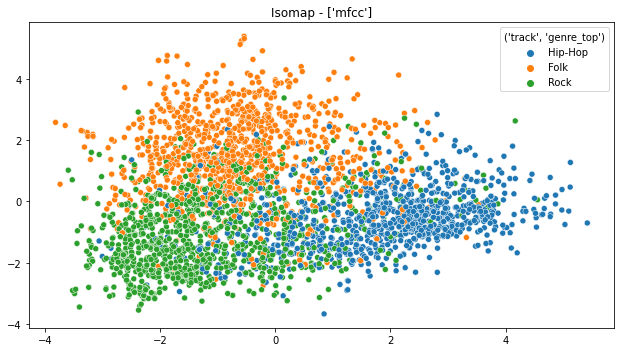

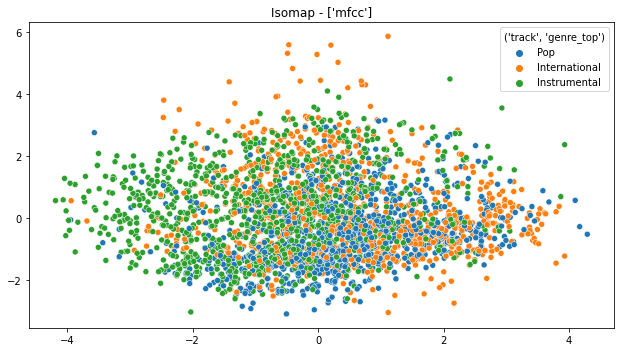

In [22]:
for genre_pair in genre_pairs:
    subset = Y.isin(genre_pair)
    Y1 = Y[subset]
    df1 = df[subset]
    utils.estimate_features(df1, Y1, feature_sets, 'Isomap',
                            Isomap(n_components=2, n_jobs=-1))
    
 #                            TSNE(n_components=2, perplexity=100, n_iter=5000, n_jobs=-1))
    



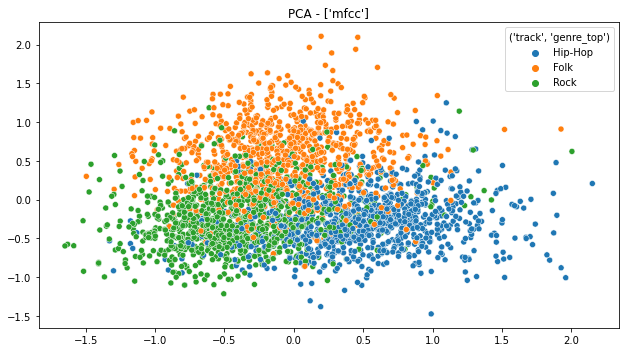

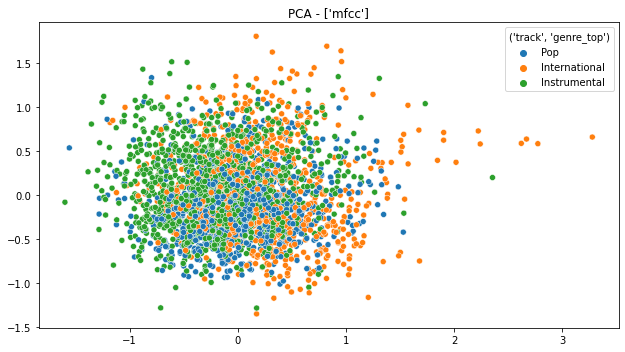

In [23]:
for genre_pair in genre_pairs:
    subset = Y.isin(genre_pair)
    Y1 = Y[subset]
    df1 = df[subset]
    utils.estimate_features(df1, Y1, feature_sets, 'PCA', PCA(n_components=2))


In [24]:
def run_estimator_genre_pairs(df, Y, genre1, genres, estimator):
    n_cols = 4
    genres = np.delete(genres, np.where(genres == genre1))
    n_rows = (len(genres)+2)//n_cols
    fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(17,5*n_rows))
    for genre2,ax in zip(genres, axs.flat):
        g_pair = [genre1, genre2]
        subset = Y.isin(g_pair)
        Y_pairs = Y[subset]
        df_pairs = df[subset]
        
        utils.run_estimator(df_pairs, Y_pairs, estimator, ax)
        ax.set_title(f'Isomap:mfcc -{genre1}/{genre2}')
        
    last_row_count = n_cols - (n_rows*n_cols - len(genres))
    if (last_row_count < n_cols):
        for to_del in range(last_row_count, n_cols):
            fig.delaxes(axs[n_rows-1,to_del])

    plt.tight_layout()
    plt.show()
 



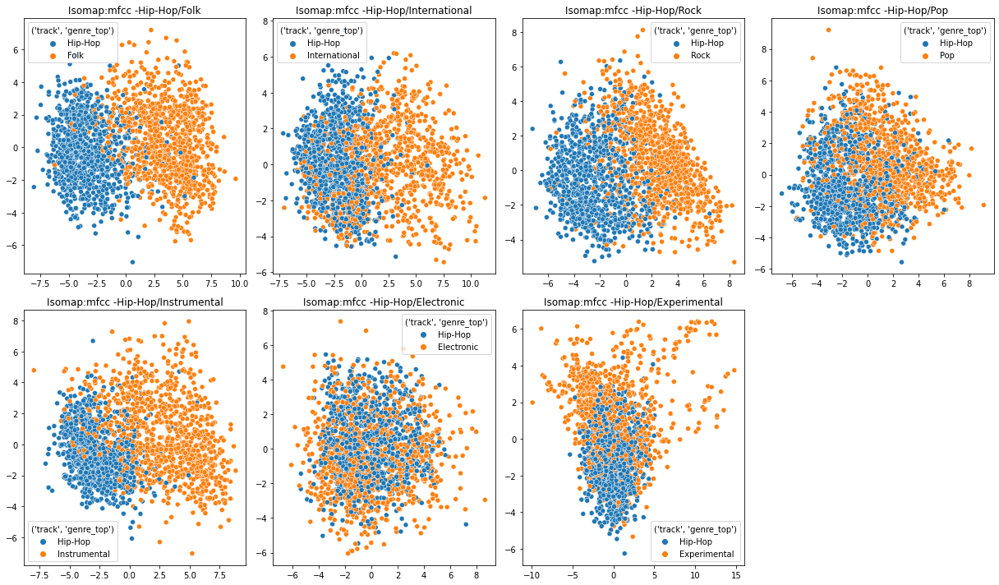

In [25]:
genre_tops = tracks[small][('track','genre_top')].value_counts().index.values

run_estimator_genre_pairs(df, Y, 'Hip-Hop', genre_tops, Isomap(n_components=2, n_jobs=-1))

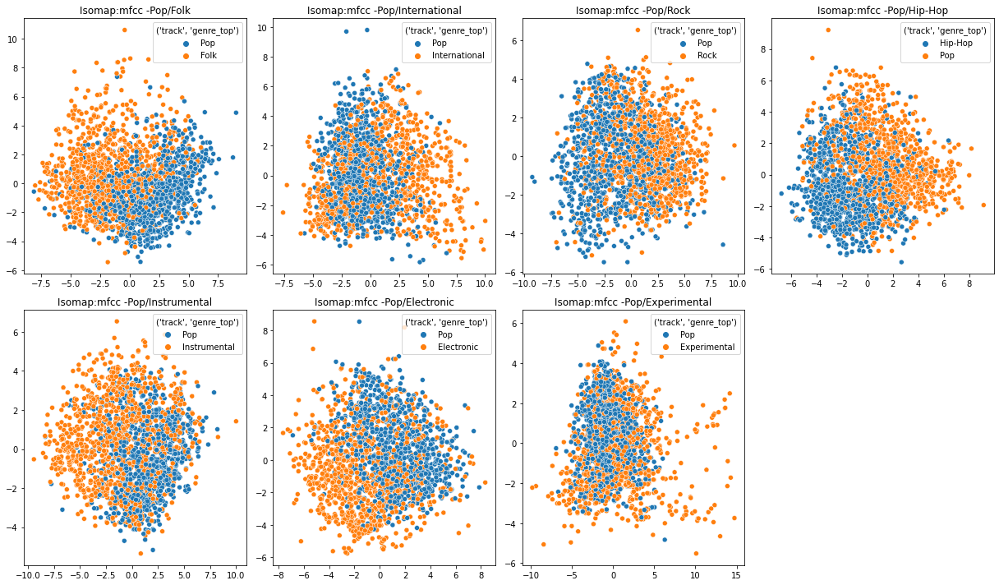

In [26]:
run_estimator_genre_pairs(df, Y, 'Pop', genre_tops, Isomap(n_components=2, n_jobs=-1))

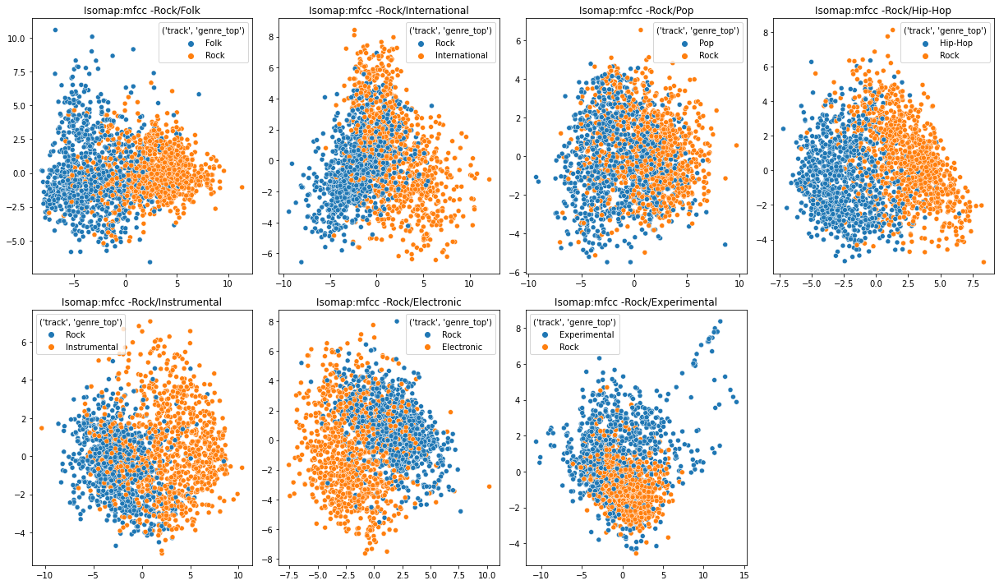

In [27]:
run_estimator_genre_pairs(df, Y, 'Rock', genre_tops, Isomap(n_components=2, n_jobs=-1))

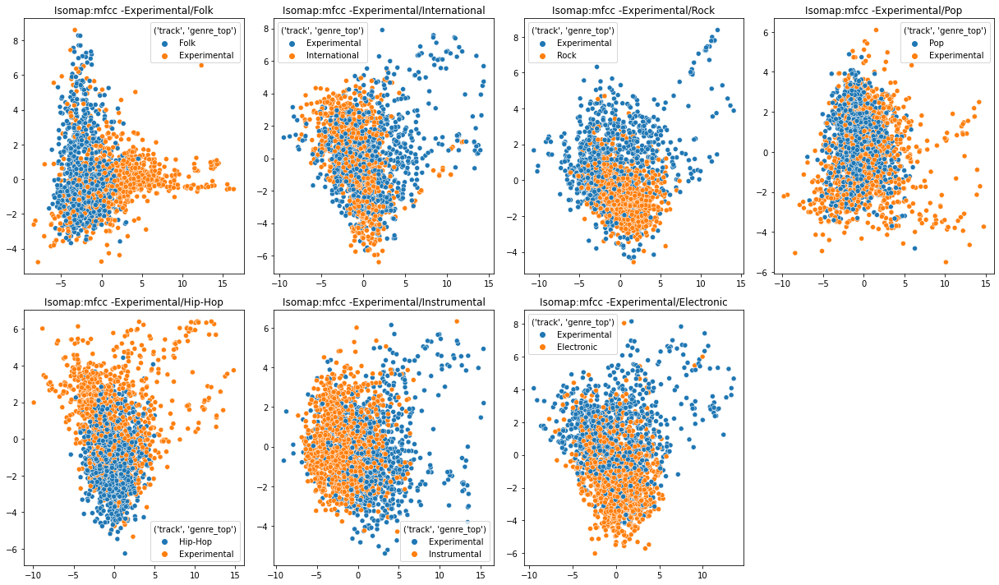

In [28]:
run_estimator_genre_pairs(df, Y, 'Experimental', genre_tops, Isomap(n_components=2, n_jobs=-1))

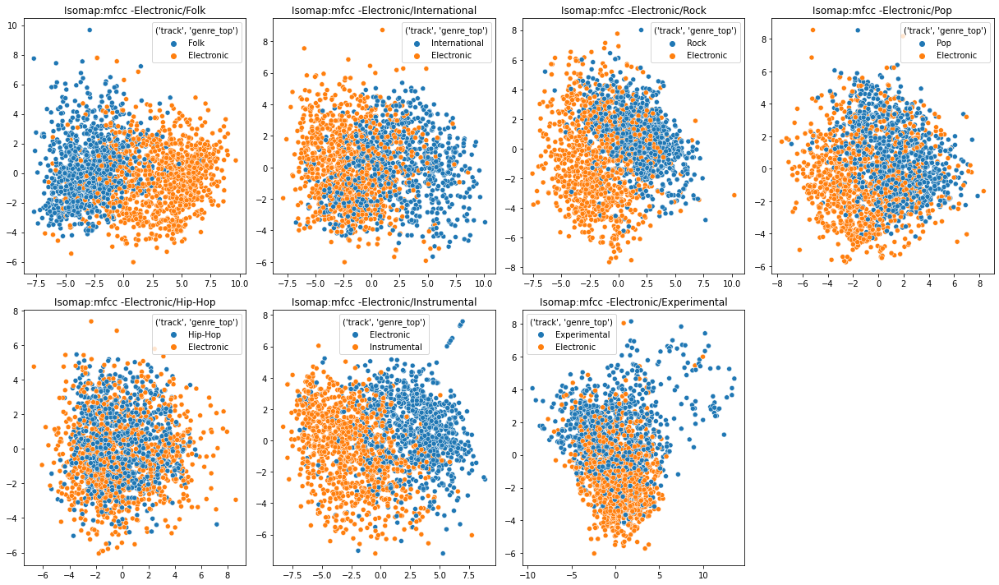

In [29]:
run_estimator_genre_pairs(df, Y, 'Electronic', genre_tops, Isomap(n_components=2, n_jobs=-1))

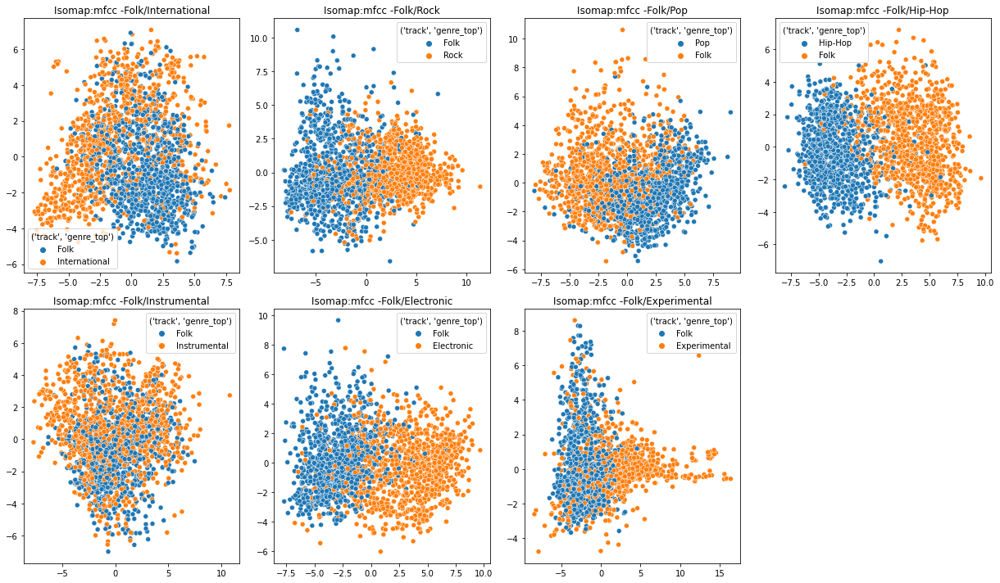

In [30]:
run_estimator_genre_pairs(df, Y, 'Folk', genre_tops, Isomap(n_components=2, n_jobs=-1))

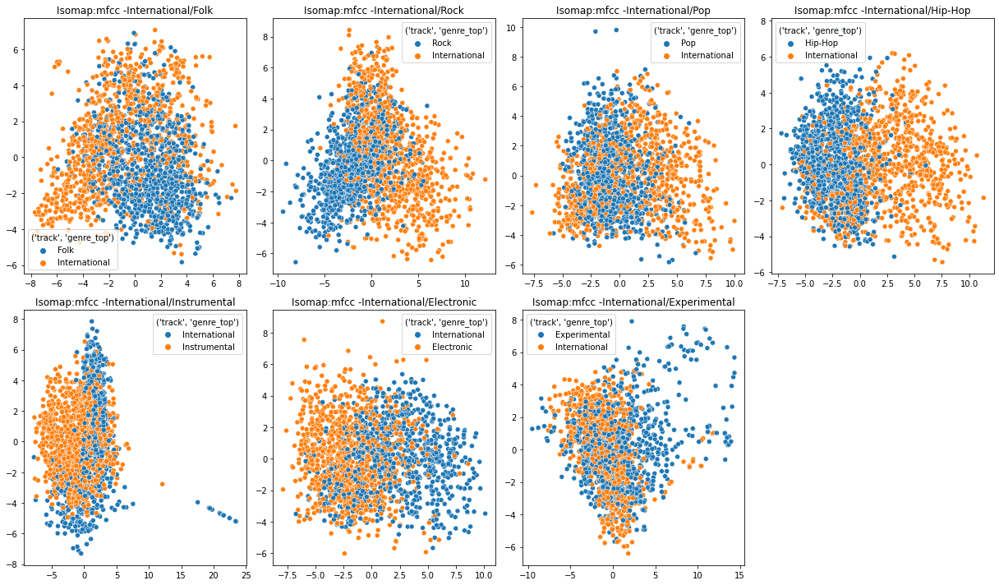

In [31]:
run_estimator_genre_pairs(df, Y, 'International', genre_tops, Isomap(n_components=2, n_jobs=-1))

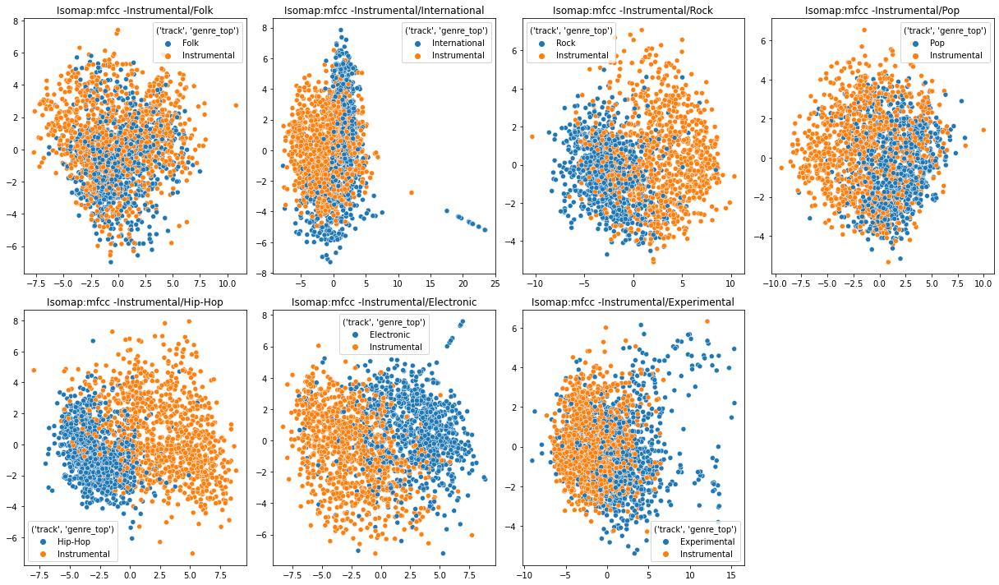

In [32]:
run_estimator_genre_pairs(df, Y, 'Instrumental', genre_tops, Isomap(n_components=2, n_jobs=-1))